In [4]:
from gluonts.dataset.repository import get_dataset

import matplotlib.pyplot as plt

import os
import pickle

In [5]:
NORMALIZER_NAME = "gas_t_student"
MEAN_MODEL = "gas"
DL_MODEL_LIBRARY = "gluonts"
DATASET_NAME = "nn5_weekly"
DATASET_TYPE = "gluonts"    # gluonts or synthetic
DL_MODEL = "deepar"

multivariate = "_multivariate"   # "_multivariate" if its multivariate, empty otherwise
multivariate = ""

ROOT_FOLDER = f"RESULTS_{DATASET_NAME}_{NORMALIZER_NAME}_{MEAN_MODEL}_{DL_MODEL_LIBRARY}_{DL_MODEL}" + multivariate

Get results

In [6]:
normalizer_folder = os.path.join(ROOT_FOLDER, "normalizer")
init_params_norm_filename = os.path.join(normalizer_folder, 'init_params.json')
###
means_folder = os.path.join(normalizer_folder, 'means')
train_means_folder = os.path.join(means_folder, 'train')
test_means_folder = os.path.join(means_folder, 'test')
vars_folder = os.path.join(normalizer_folder, 'vars')
train_vars_folder = os.path.join(vars_folder, 'train')
test_vars_folder = os.path.join(vars_folder, 'test')
norm_ts_folder = os.path.join(normalizer_folder, 'normalized_ts')
train_norm_ts_folder = os.path.join(norm_ts_folder, 'train')
test_norm_ts_folder = os.path.join(norm_ts_folder, 'test')
params_folder = os.path.join(normalizer_folder, 'normalizer_params')
train_params_folder = os.path.join(params_folder, 'train')
test_params_folder = os.path.join(params_folder, 'test')

train_means = []
for i in range(len(os.listdir(train_means_folder))):
    with open(os.path.join(train_means_folder, f'ts_{i}.pkl'), 'rb') as f:
        train_means.append(pickle.load(f))
test_means = []
for i in range(len(os.listdir(test_means_folder))):
    with open(os.path.join(test_means_folder, f'ts_{i}.pkl'), 'rb') as f:
        test_means.append(pickle.load(f))
train_vars = []
for i in range(len(os.listdir(train_vars_folder))):
    with open(os.path.join(train_vars_folder, f'ts_{i}.pkl'), 'rb') as f:
        train_vars.append(pickle.load(f))
test_vars = []
for i in range(len(os.listdir(test_vars_folder))):
    with open(os.path.join(test_vars_folder, f'ts_{i}.pkl'), 'rb') as f:
        test_vars.append(pickle.load(f))
train_params = []
for i in range(len(os.listdir(train_params_folder))):
    with open(os.path.join(train_params_folder, f'ts_{i}.pkl'), 'rb') as f:
        train_params.append(pickle.load(f))
test_params = []
for i in range(len(os.listdir(test_params_folder))):
    with open(os.path.join(test_params_folder, f'ts_{i}.pkl'), 'rb') as f:
        test_params.append(pickle.load(f))
test_norm_ts = []
for i in range(len(os.listdir(test_norm_ts_folder))):
    with open(os.path.join(test_norm_ts_folder, f'ts_{i}.pkl'), 'rb') as f:
        test_norm_ts.append(pickle.load(f))

Get dataset

In [7]:
from data_manager import GluonTSDataManager

bool_multivar = False if multivariate == "" else True
data_manager = GluonTSDataManager(DATASET_NAME, bool_multivar)

prediction_length = data_manager.prediction_length
context_length = data_manager.context_length

data_manager.set_data_from_normalizer(train_means, train_vars, test_means, test_vars, train_params)
train_dataset, test_dataset = data_manager.get_gluon_dataset_for_dl_layer()

Plot stuff

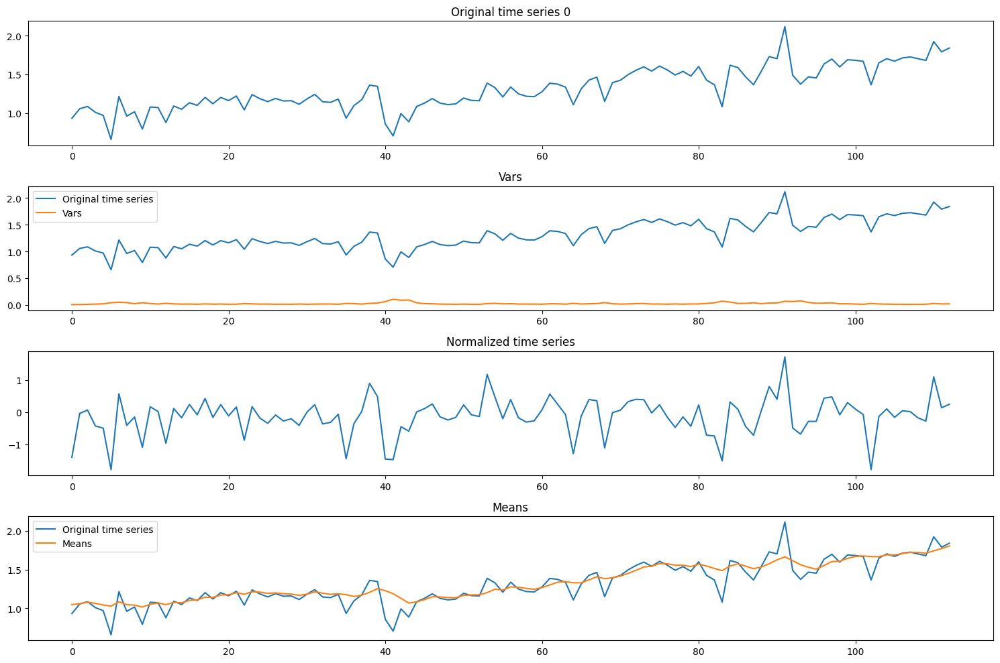

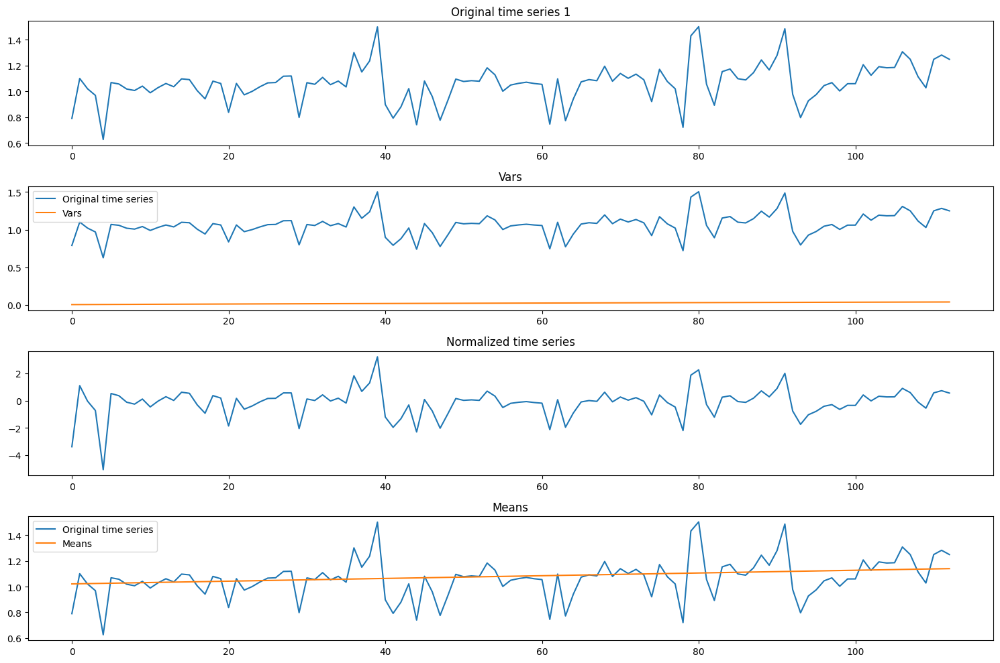

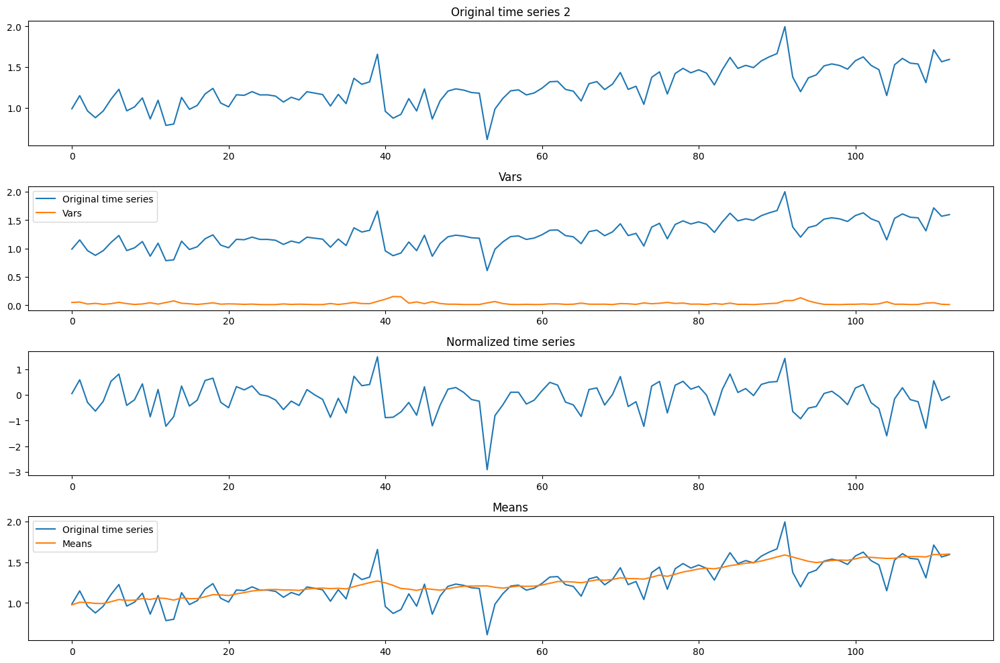

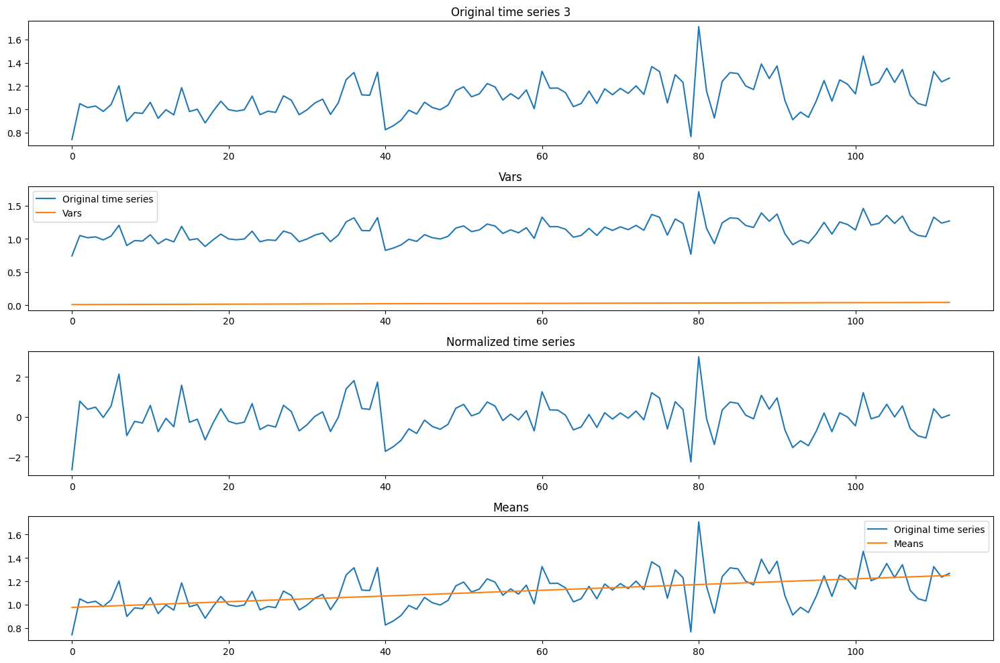

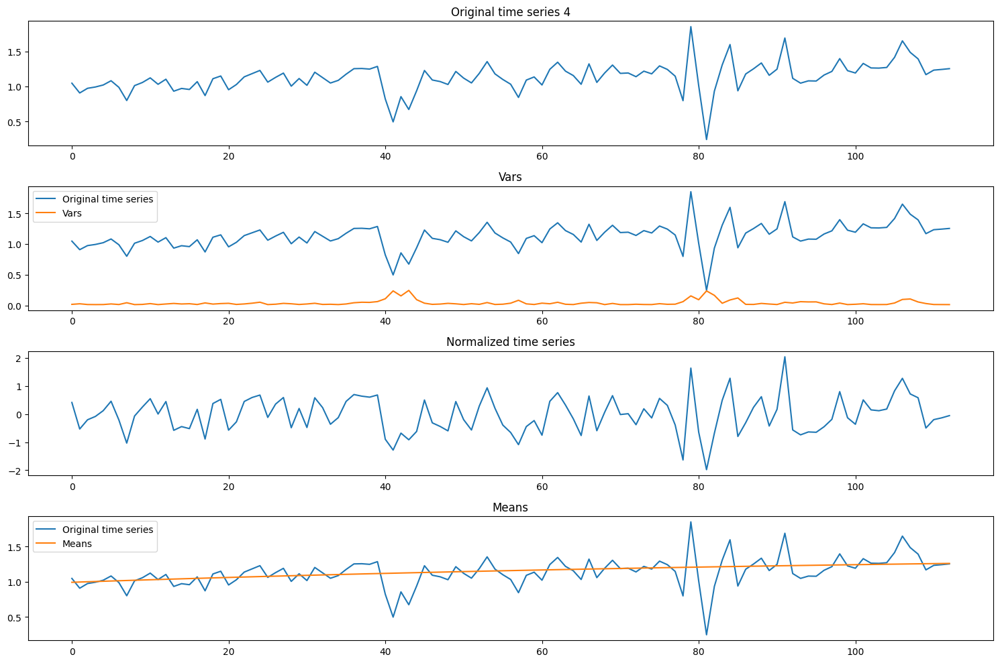

...

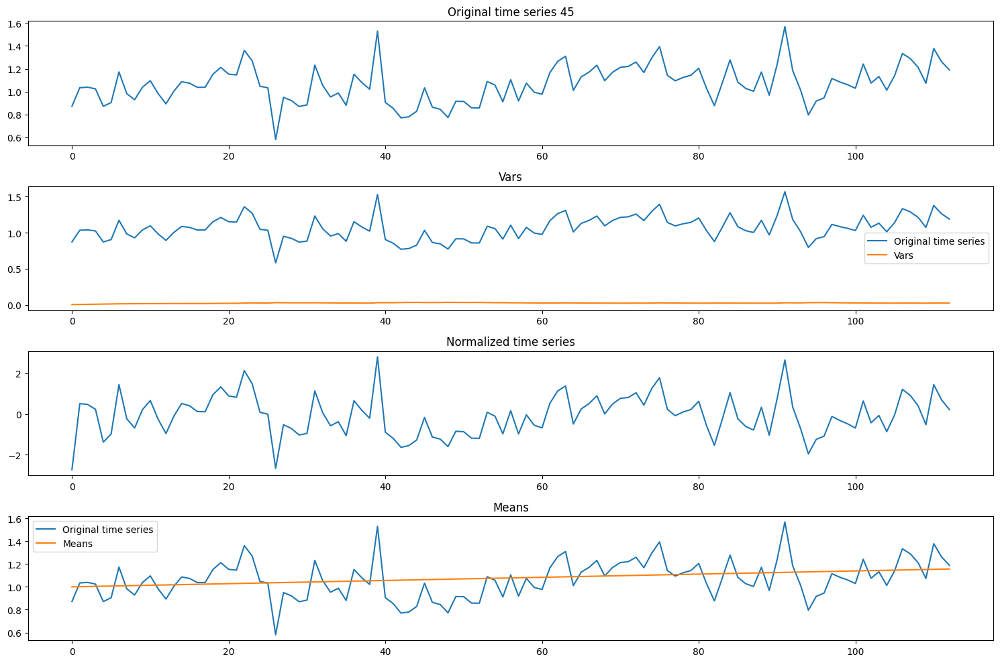

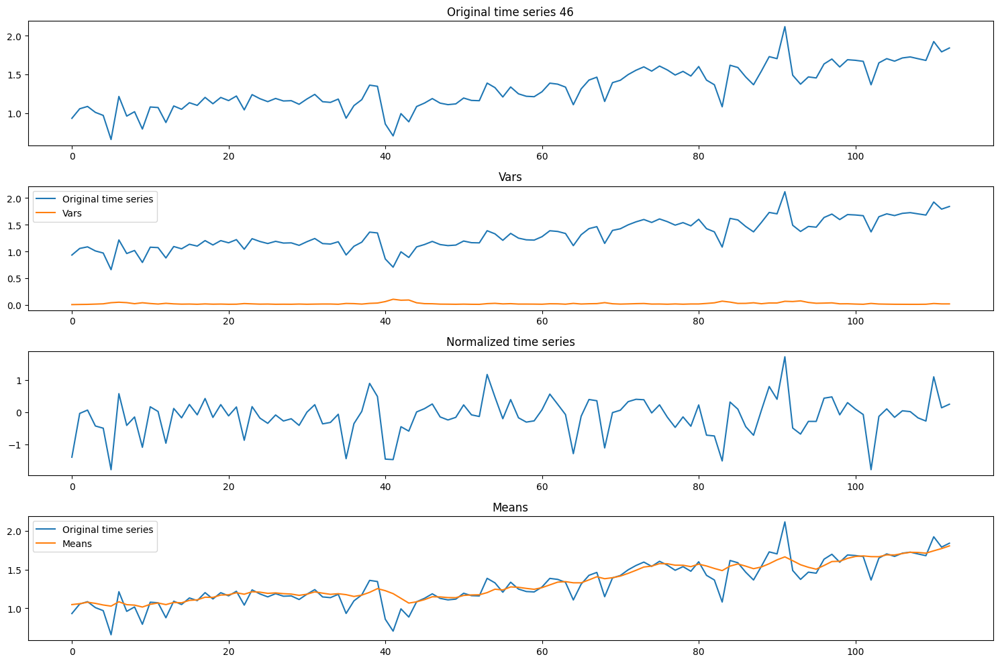

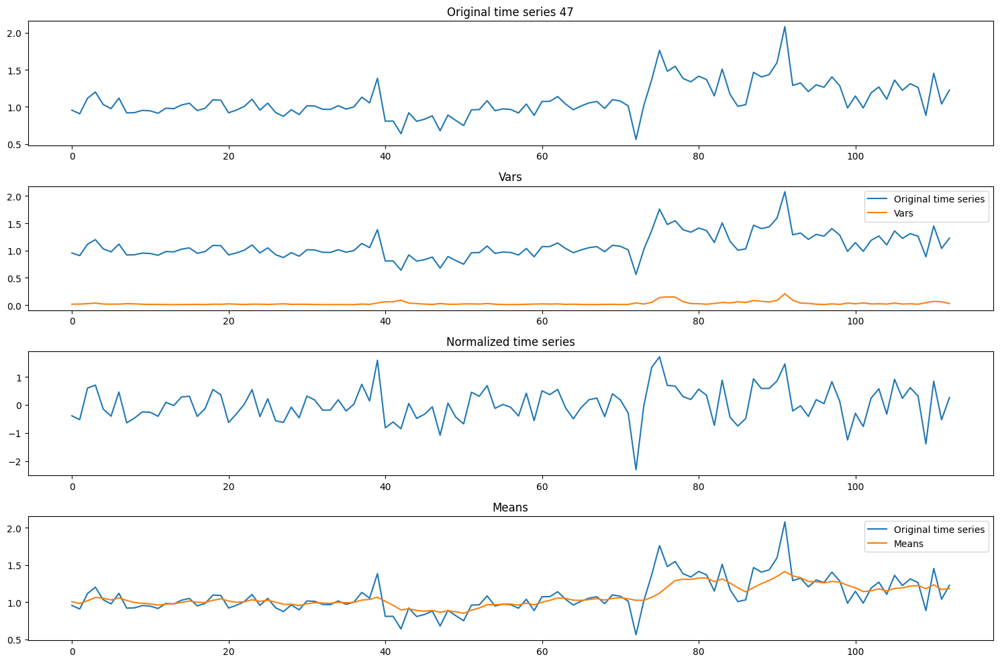

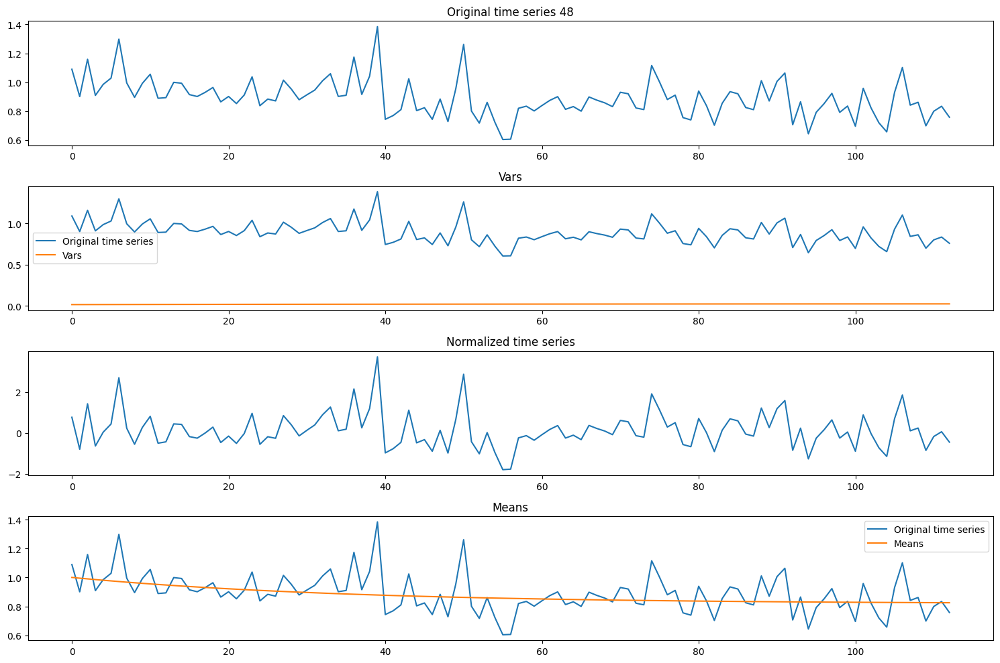

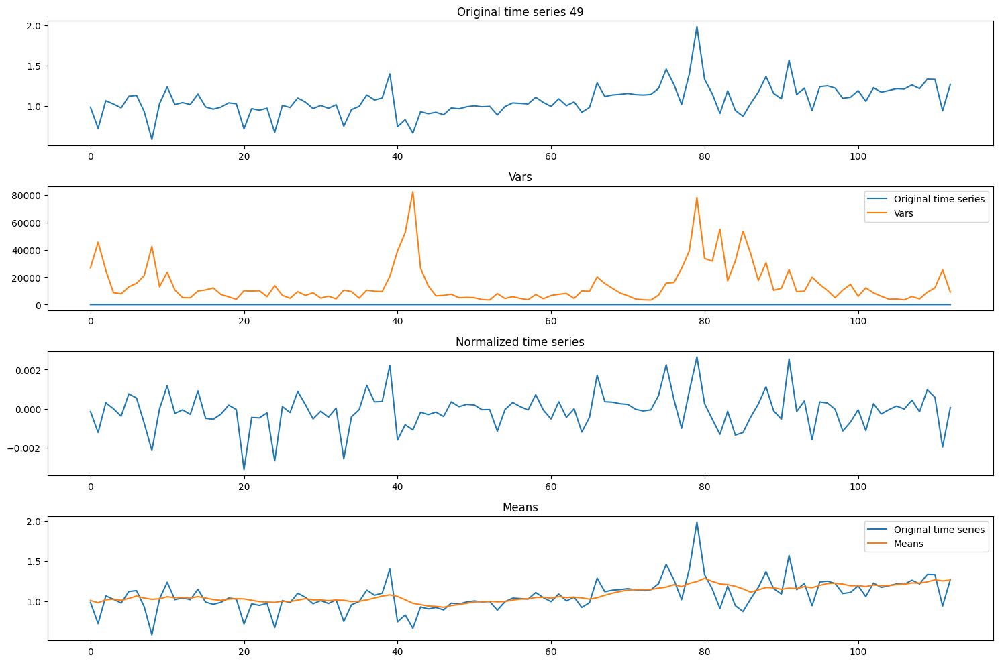

In [8]:
for ts_index in range(min(50, len(test_dataset))):

    # create a subfigure with 5 plots in each: 
    # - the original time series, 
    # - the normalized time series, 
    # - the original time series with its means,
    # - the original time series with its vars,
    # - the original time series with the predictions
    ts = test_dataset[ts_index]["target"]
    means = test_means[ts_index]
    vars = test_vars[ts_index]
    norm_ts = test_norm_ts[ts_index]

    fig, axs = plt.subplots(4, 1, figsize=(15, 10))
    axs[0].plot(ts)
    axs[0].set_title(f'Original time series {ts_index}')

    axs[1].plot(ts)
    axs[1].plot(vars)
    axs[1].set_title('Vars')
    axs[1].legend(['Original time series', 'Vars'])

    axs[2].plot(norm_ts)
    axs[2].set_title('Normalized time series')

    axs[3].plot(ts)
    axs[3].plot(means)
    axs[3].set_title('Means')
    axs[3].legend(['Original time series', 'Means'])

    plt.tight_layout()
    plt.show()

Load the DL model

In [9]:
import pickle

dl_folder = os.path.join(ROOT_FOLDER, "dl_model")

with open(os.path.join(dl_folder, "dl_model.pkl"), "rb") as f:
    predictor = pickle.load(f)

In [10]:
from gluonts.evaluation import make_evaluation_predictions

forecast_it, ts_it = make_evaluation_predictions(
    dataset=test_dataset,  # test dataset
    predictor=predictor,  # predictor
    num_samples=100,  # number of sample paths we want for evaluation
)

forecasts = list(forecast_it)
tss = list(ts_it)

In [11]:
import json
from gluonts.evaluation import Evaluator

evaluator = Evaluator(quantiles=[0.1, 0.5, 0.9])
agg_metrics, item_metrics = evaluator(tss, forecasts)

print(json.dumps(agg_metrics, indent=4))

Running evaluation: 0it [00:00, ?it/s]

Running evaluation: 111it [00:00, 253.66it/s]


{
    "MSE": 0.05175902209504767,
    "abs_error": 151.2401067018509,
    "abs_target_sum": 991.6371474266052,
    "abs_target_mean": 1.116708499354285,
    "seasonal_error": 0.13190664670075794,
    "MASE": 1.300283698003354,
    "MAPE": 0.15363562227906408,
    "sMAPE": 0.15822305825648006,
    "MSIS": 12.353278758696835,
    "QuantileLoss[0.1]": 75.10821663737296,
    "Coverage[0.1]": 0.013513513513513514,
    "QuantileLoss[0.5]": 151.2401056587696,
    "Coverage[0.5]": 0.40540540540540543,
    "QuantileLoss[0.9]": 79.34605641365052,
    "Coverage[0.9]": 0.9132882882882883,
    "RMSE": 0.2275060924350108,
    "NRMSE": 0.2037291670714083,
    "ND": 0.15251557194517537,
    "wQuantileLoss[0.1]": 0.07574163274569341,
    "wQuantileLoss[0.5]": 0.1525155708932974,
    "wQuantileLoss[0.9]": 0.08001521183384593,
    "mean_absolute_QuantileLoss": 101.89812623659769,
    "mean_wQuantileLoss": 0.10275747182427891,
    "MAE_Coverage": 0.4132882882882884,
    "OWA": NaN
}


In [12]:
item_metrics.head()

,item_id,forecast_start,MSE,abs_error,abs_target_sum,abs_target_mean,seasonal_error,MASE,MAPE,sMAPE,ND,MSIS,QuantileLoss[0.1],Coverage[0.1],QuantileLoss[0.5],Coverage[0.5],QuantileLoss[0.9],Coverage[0.9]
0,None,1998-03-23/1998-03-29,0.040747,1.402296,14.038123,1.754765,0.122385,1.432264,0.099509,0.101355,0.099892,10.759425,0.590852,0.0,1.402296,0.250,0.428313,0.875
1,None,1998-03-23/1998-03-29,0.021121,0.984101,9.664433,1.208054,0.124671,0.986701,0.100515,0.106704,0.101827,12.030255,0.676196,0.0,0.984101,0.250,0.495077,1.000
2,None,1998-03-23/1998-03-29,0.029905,1.164922,12.394274,1.549284,0.131884,1.104118,0.093638,0.092989,0.093989,9.934259,0.462114,0.0,1.164922,0.750,0.583902,1.000
3,None,1998-03-23/1998-03-29,0.024271,1.011893,9.606252,1.200781,0.124825,1.013308,0.107375,0.104095,0.105337,11.444463,0.524104,0.0,1.011893,0.750,0.673950,1.000
4,None,1998-03-23/1998-03-29,0.040986,1.276761,10.837271,1.354659,0.161601,0.987586,0.111834,0.117855,0.117812,8.035226,0.705627,0.0,1.276761,0.125,0.376345,0.875


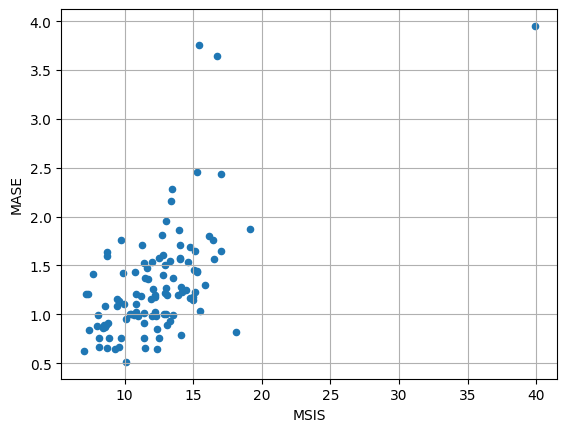

In [13]:
import matplotlib.pyplot as plt

item_metrics.plot(x="MSIS", y="MASE", kind="scatter")
plt.grid(which="both")
plt.show()

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [2.0197675 1.7500621 1.6468976 1.4887472 1.5274855 1.601089  1.7270294
 1.6966935]
0.5-quantile (median) of the future window:
 [2.0218554 1.7730067 1.648068  1.4926194 1.5396913 1.5626297 1.7206169
 1.7049688]


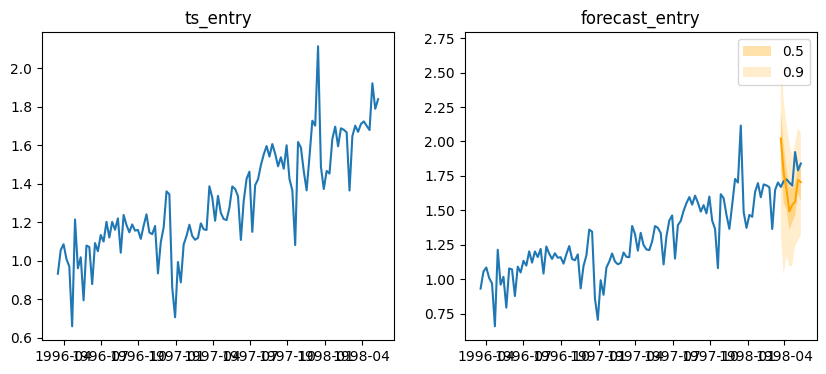

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.2585734 1.2228897 0.9457743 1.2227955 1.0025796 1.0771772 1.1327372
 1.2511879]
0.5-quantile (median) of the future window:
 [1.2970647  1.181402   0.93033457 1.1882873  0.9582566  1.1476506
 1.1291789  1.2199273 ]


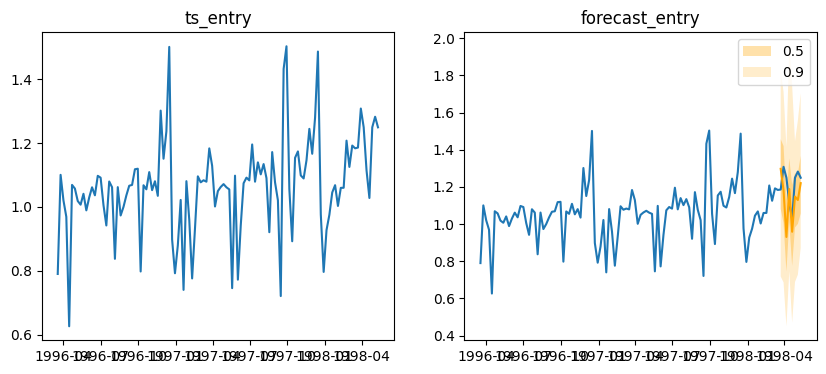

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.8250971 1.7759509 1.6045853 1.3148824 1.3984597 1.4769201 1.6242764
 1.6375372]
0.5-quantile (median) of the future window:
 [1.8290029 1.736595  1.6033909 1.3277035 1.4161633 1.4648201 1.5987183
 1.6710173]


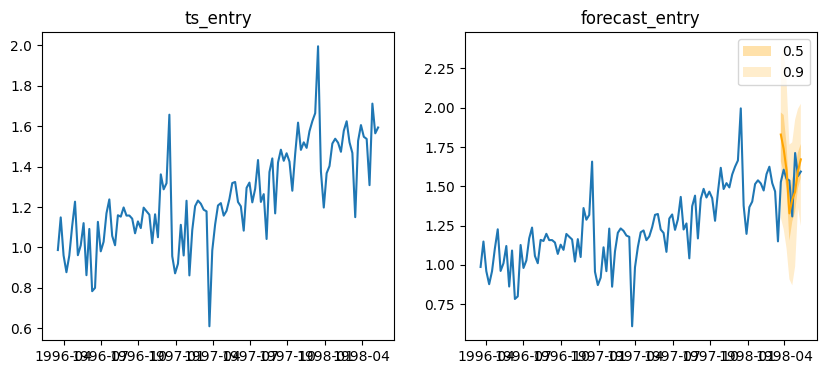

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.539504  1.3515723 1.218004  1.1400964 1.1864591 1.0958388 1.2872604
 1.21867  ]
0.5-quantile (median) of the future window:
 [1.455468  1.3950844 1.2106559 1.1894791 1.2122664 1.1086849 1.2833525
 1.2064189]


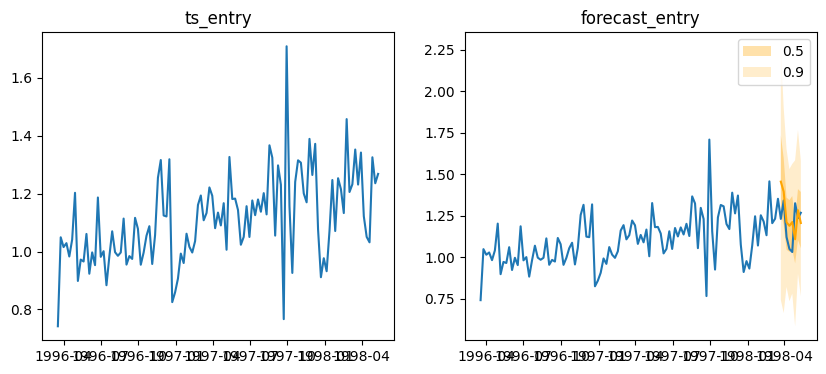

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.6183308 1.3062849 1.2307814 1.1026752 1.103784  1.2063    1.1399648
 1.1806589]
0.5-quantile (median) of the future window:
 [1.6267533 1.3488833 1.2288548 1.1386831 1.1044384 1.1845744 1.1869736
 1.1654347]


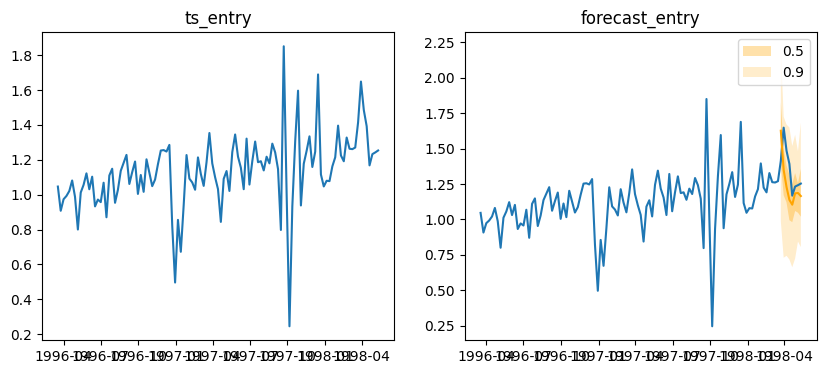

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.5041018 1.2743653 1.02744   1.0202969 1.005122  1.1337415 1.1188998
 1.0973057]
0.5-quantile (median) of the future window:
 [1.5100145 1.267047  1.0606774 1.0014828 1.0207566 1.1051319 1.0861049
 1.1229979]


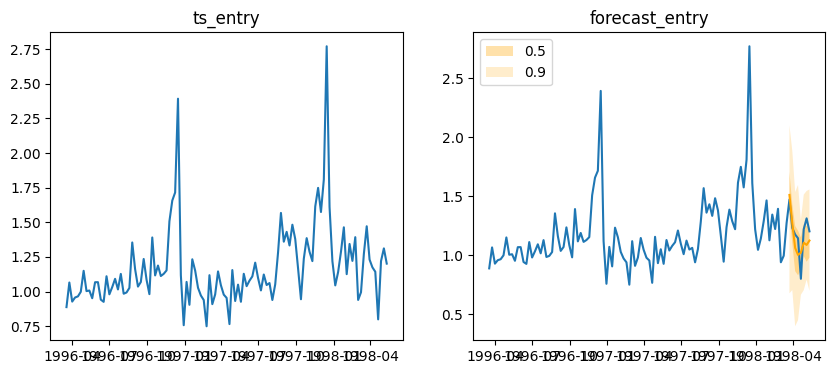

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.4653275 1.2123088 0.9912001 1.0173488 0.9550116 1.0254796 1.0089471
 1.008687 ]
0.5-quantile (median) of the future window:
 [1.4491597  1.226479   0.9958647  1.0276257  0.96866053 1.0360771
 1.0003026  1.006943  ]


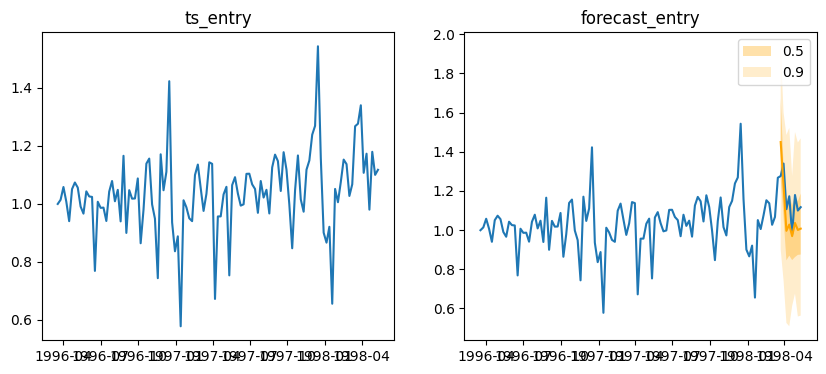

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.1581626  0.9581596  0.8903651  0.7249633  0.9234819  0.85440964
 0.92583984 0.8410988 ]
0.5-quantile (median) of the future window:
 [1.1235615  0.9876169  0.91951305 0.7468369  0.8869856  0.86035585
 0.90280855 0.8254119 ]


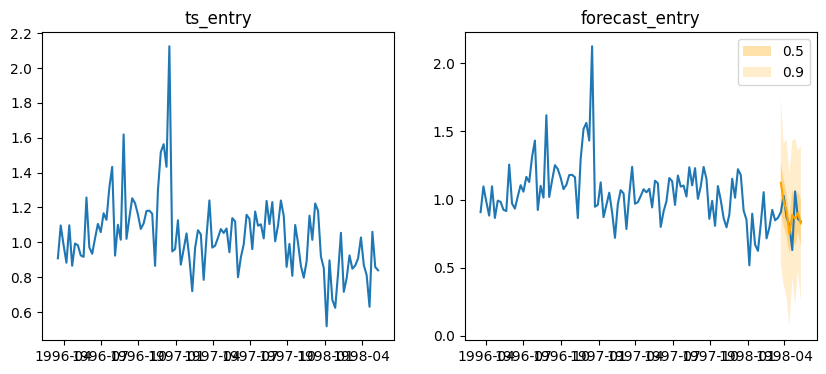

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [0.7534702  0.80590284 0.8218763  0.7914386  0.8720285  0.83760047
 1.0235065  0.979527  ]
0.5-quantile (median) of the future window:
 [0.7238069  0.80607295 0.82140356 0.7988576  0.937084   0.8951291
 0.99209976 0.9561192 ]


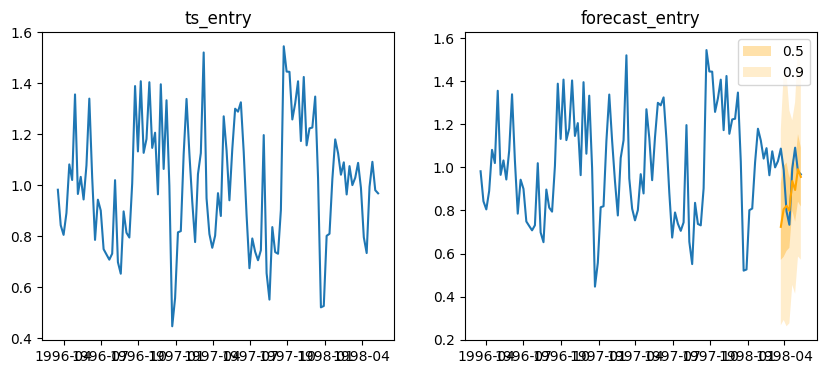

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.5663099 1.4309204 1.2308742 0.9642339 1.162755  1.2699552 1.3222356
 1.2865269]
0.5-quantile (median) of the future window:
 [1.5750232 1.3688638 1.2593137 1.1035728 1.1442083 1.2556199 1.3116287
 1.2562383]


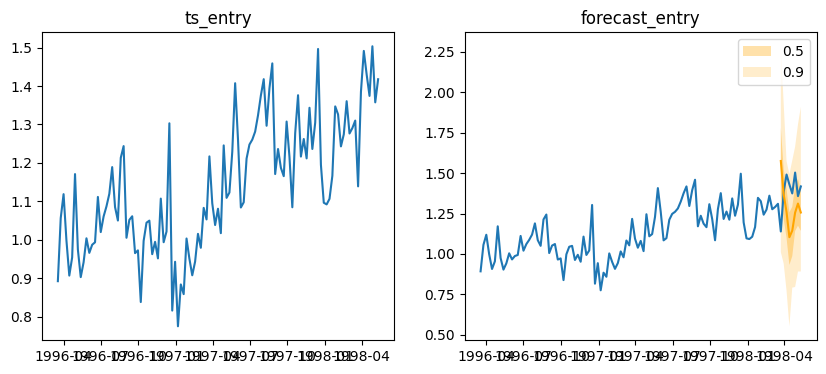

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [0.9199668  0.795097   0.66337705 0.6326055  0.6155362  0.5751337
 0.66049665 0.7116401 ]
0.5-quantile (median) of the future window:
 [0.9339223  0.7901027  0.67528963 0.61460286 0.6079036  0.59784365
 0.6525161  0.6725277 ]


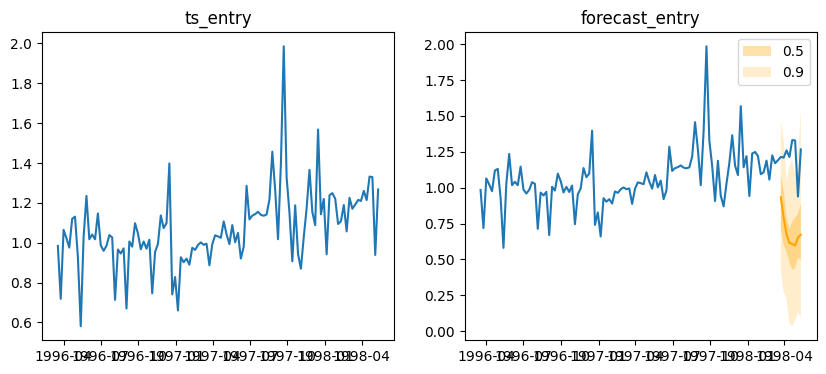

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.4297599  0.9353472  0.94198066 0.7917579  0.8183363  0.8309672
 1.0143665  0.90091014]
0.5-quantile (median) of the future window:
 [1.4410487  0.9059953  0.93176913 0.75099576 0.7887363  0.8017397
 1.0194576  0.90474   ]


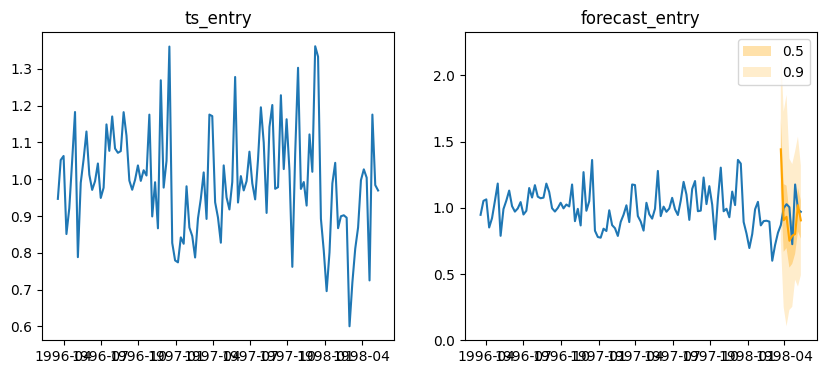

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.4391295  1.2309132  1.1349807  0.98569834 0.9033497  0.899143
 0.9856335  0.9723342 ]
0.5-quantile (median) of the future window:
 [1.4291865  1.196886   1.11048    0.97562206 0.8374865  0.9368247
 0.9868326  0.98746693]


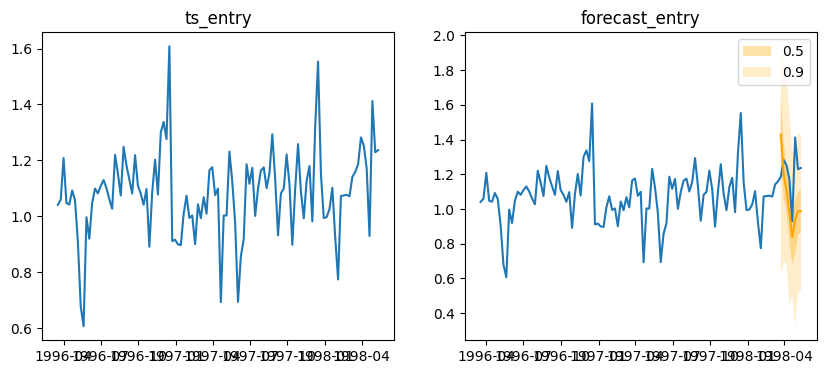

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.2833023  1.0382744  1.0520388  0.94293654 0.9720886  0.9093439
 0.921978   1.0132848 ]
0.5-quantile (median) of the future window:
 [1.3378165  1.0281543  1.0268525  0.95349276 1.0089213  0.8993299
 0.9354099  1.054222  ]


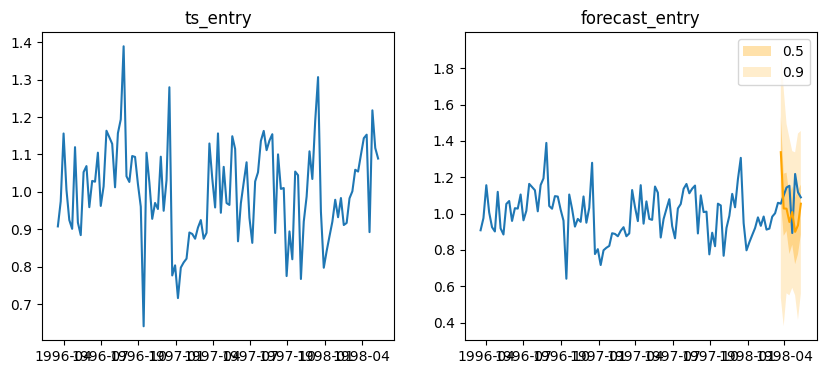

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.482163   1.175509   1.1471863  1.0640043  1.1208612  0.97008234
 1.0961055  1.1158043 ]
0.5-quantile (median) of the future window:
 [1.4642063  1.382898   1.2073555  0.97373205 1.1063702  0.8899394
 1.0916827  1.1066132 ]


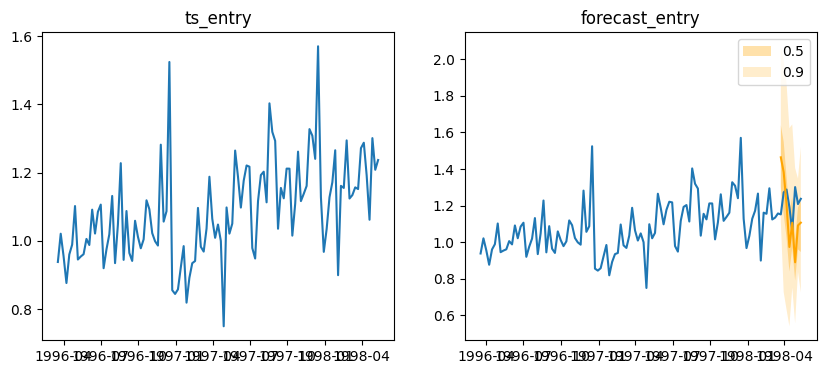

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.236735   1.0359113  0.8936802  0.85125685 0.8565947  0.7385074
 0.7634489  0.75878835]
0.5-quantile (median) of the future window:
 [1.2629781 1.0372623 0.8831009 0.8700923 0.848189  0.7629237 0.7733566
 0.8403257]


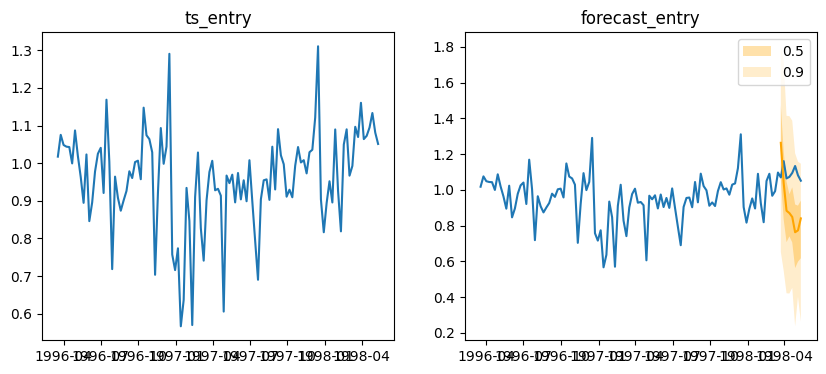

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.2085019  1.1436678  0.8175848  0.83142143 0.75060195 0.8728692
 0.90755945 0.957367  ]
0.5-quantile (median) of the future window:
 [1.226293   1.1292466  0.8365587  0.77818847 0.7488672  0.8775776
 0.9128101  0.9200647 ]


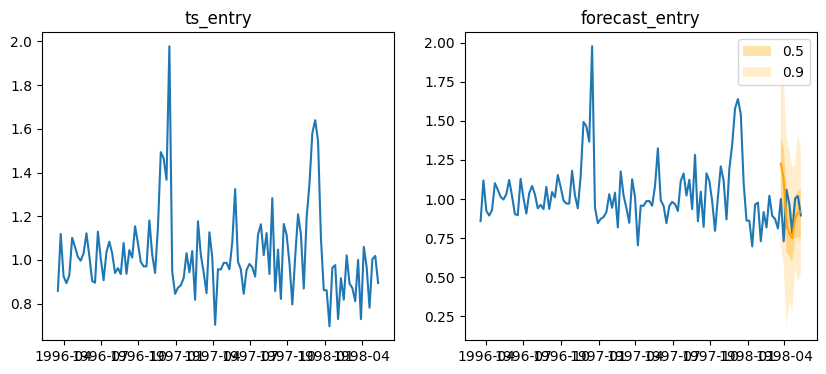

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.1289084  0.96051127 1.0586356  0.81829417 0.93108046 0.9590197
 0.93371004 0.9326063 ]
0.5-quantile (median) of the future window:
 [1.137523   0.9498636  1.0001175  0.89472806 0.936437   0.9510095
 0.91740435 0.9538019 ]


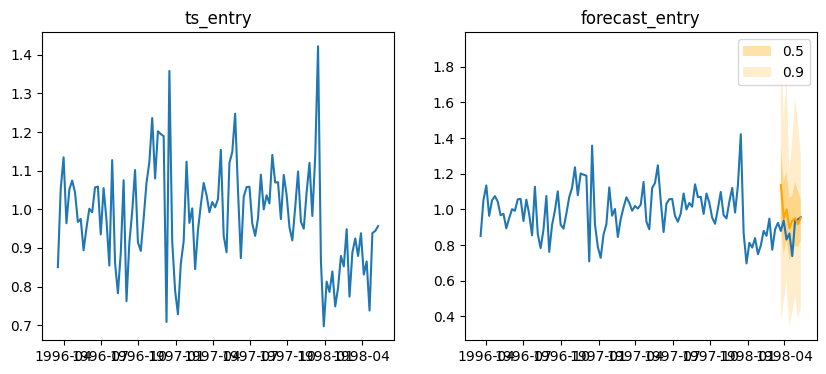

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.1897784 1.3094008 1.0026851 0.9612238 0.8487295 0.9515391 1.0088736
 1.1342406]
0.5-quantile (median) of the future window:
 [1.2433712  1.2474108  1.0373784  0.9420282  0.860281   0.982258
 0.98454154 1.0447478 ]


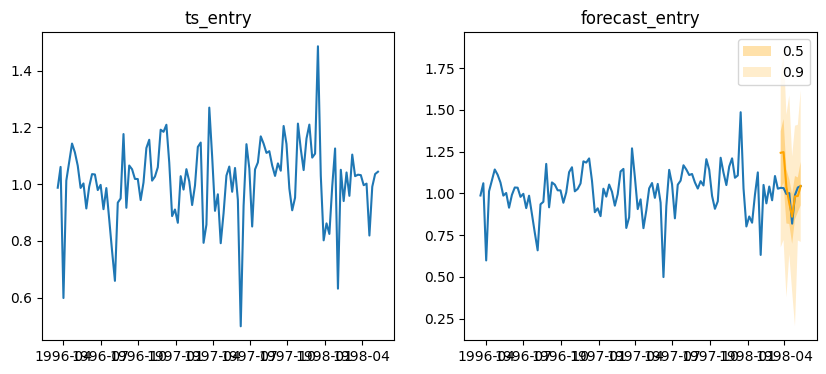

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.2230322  1.0755404  0.8903392  0.88367224 0.9673345  0.85099775
 0.9846247  0.96883154]
0.5-quantile (median) of the future window:
 [1.2853482  1.183315   0.91702235 0.90057343 0.9638782  0.8496125
 0.9520751  1.0047928 ]


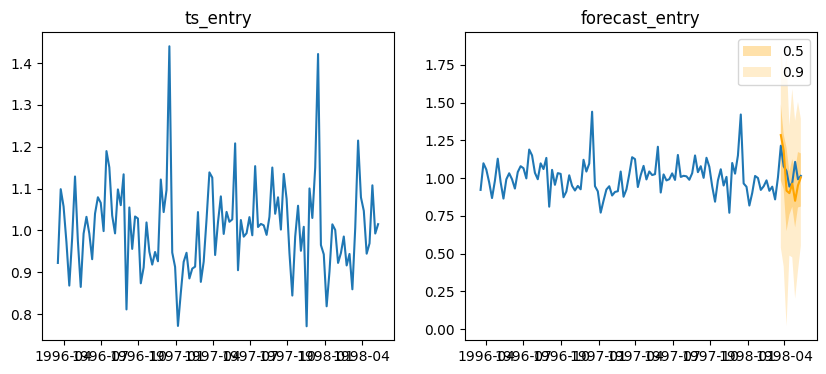

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.3399744  1.1473079  1.1076773  0.6912131  0.86024547 0.8784891
 0.88592607 0.9157477 ]
0.5-quantile (median) of the future window:
 [1.3566911  1.1288044  1.1077517  0.72082293 0.8527894  0.8706206
 0.9000291  0.9395195 ]


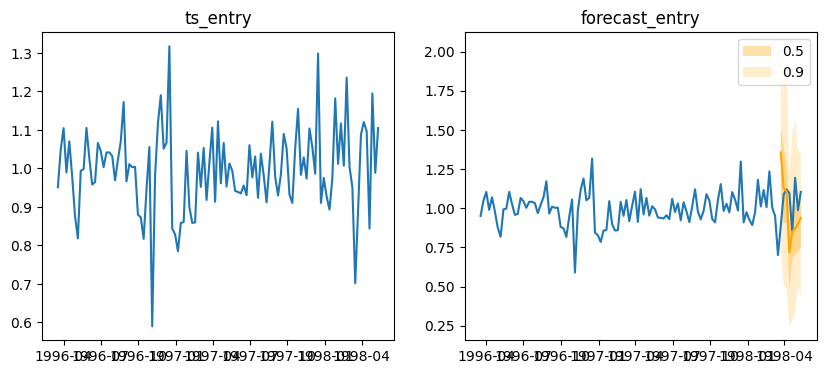

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.3838583  1.0785742  1.030659   0.94533676 0.9911737  0.94157165
 0.9970069  1.074275  ]
0.5-quantile (median) of the future window:
 [1.3948512  1.0336877  1.0352262  0.9535902  0.95445424 0.9498245
 1.0499914  1.0938123 ]


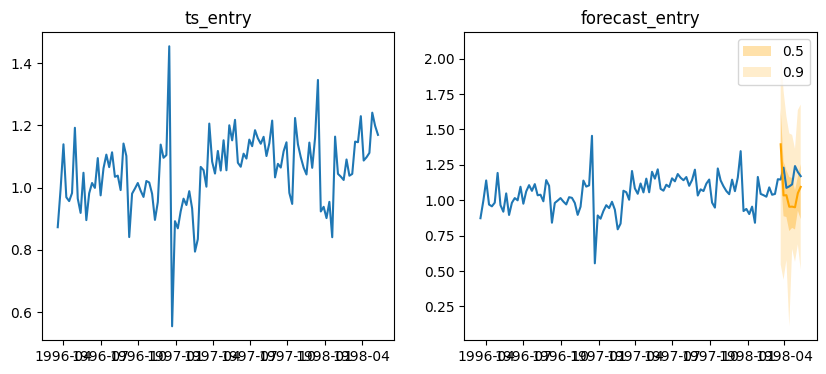

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.0814415  0.89949965 0.93736464 0.6894185  0.7427377  0.7507992
 0.6902105  0.7924149 ]
0.5-quantile (median) of the future window:
 [1.0734713  0.92566335 0.89906424 0.69968194 0.7736103  0.75253916
 0.70487744 0.7410161 ]


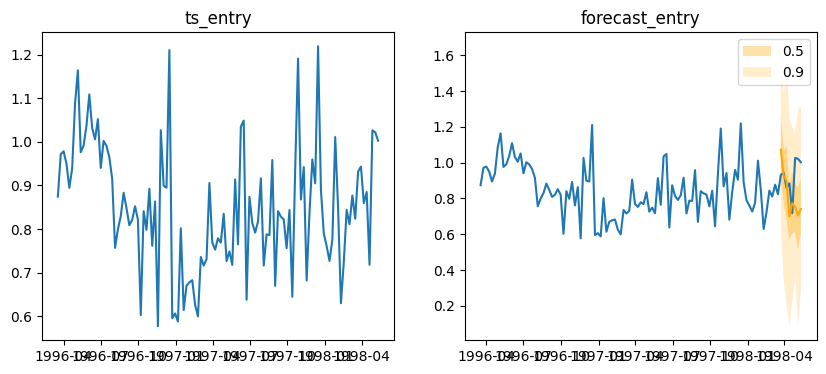

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.351507   1.2238375  1.119525   0.95652276 0.9497608  1.0056715
 1.0893812  1.0788624 ]
0.5-quantile (median) of the future window:
 [1.3523122  1.2176197  1.0755526  1.011043   0.96602756 0.97232103
 1.1156349  1.0863644 ]


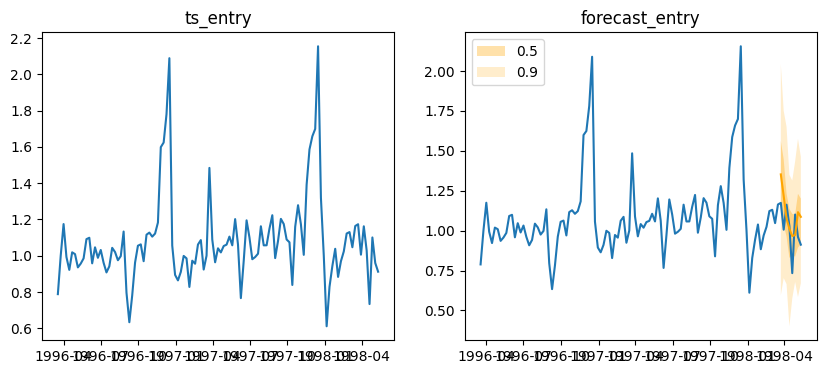

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.479548  1.4010237 1.1513885 1.032571  1.0266911 1.2780049 1.3287141
 1.3073187]
0.5-quantile (median) of the future window:
 [1.4743003 1.3751231 1.1546268 1.0378091 1.0997828 1.2600561 1.33932
 1.2916747]


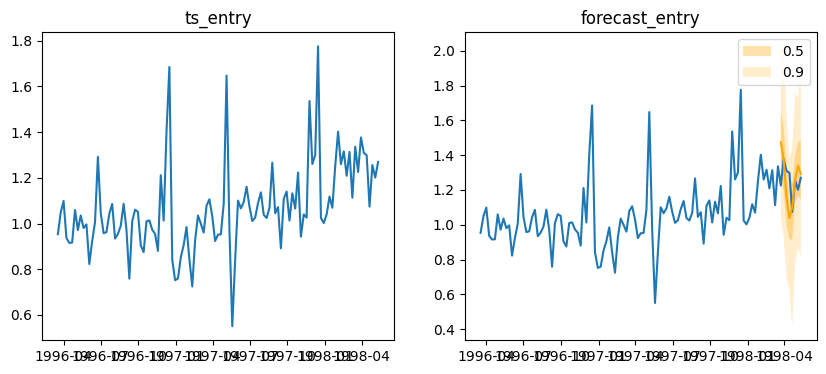

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [2.2784452 2.0487716 1.954773  1.7164301 1.69689   1.8475113 1.8782806
 1.8998723]
0.5-quantile (median) of the future window:
 [2.302597  2.0502927 1.902233  1.6763644 1.7256514 1.8296677 1.8880757
 1.8807267]


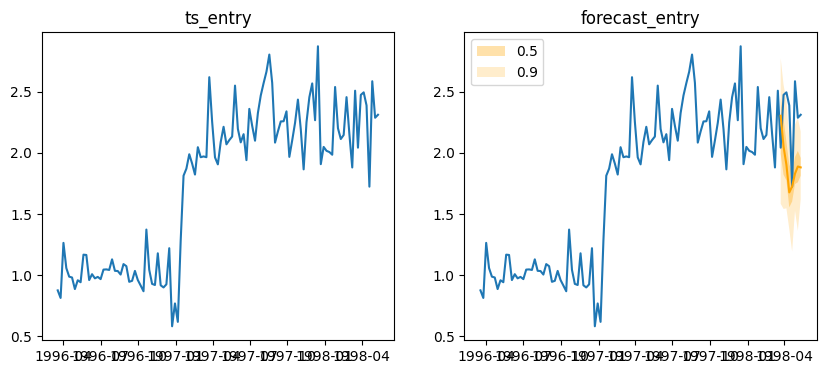

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.2153338  0.98791933 0.9908679  0.8508547  0.82787156 0.8212362
 0.8263288  1.017867  ]
0.5-quantile (median) of the future window:
 [1.2776251  1.0009446  0.91780543 0.8499868  0.83870536 0.82961047
 0.89094436 0.9507777 ]


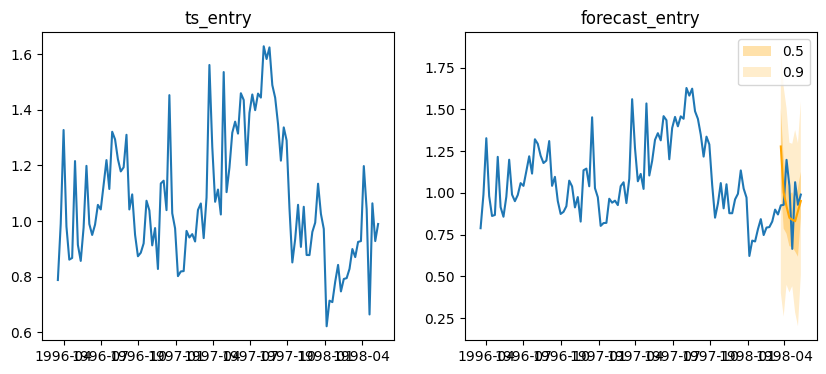

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.5247393  1.2593105  1.1642016  1.04306    1.0927962  0.96575165
 1.0040901  1.031218  ]
0.5-quantile (median) of the future window:
 [1.5109102  1.2568893  1.1333917  1.0362248  1.0185322  0.94733554
 0.99452245 1.0874522 ]


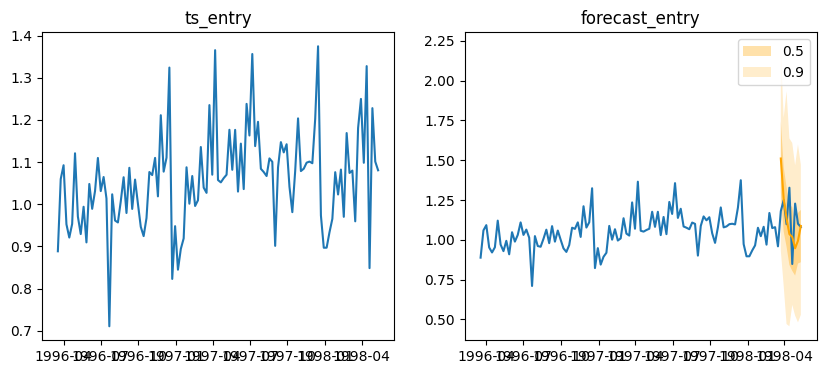

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.5188015  1.2052189  1.1974269  0.9498142  1.0202922  1.0057298
 0.96431714 1.3494697 ]
0.5-quantile (median) of the future window:
 [1.5446798 1.222331  1.1754574 0.9370519 1.0184096 1.0175512 1.0351048
 1.0958956]


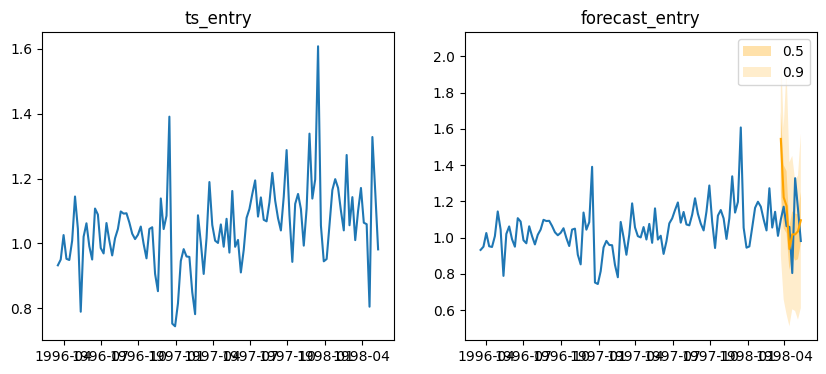

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [0.87890416 0.51645666 0.5761806  0.43308595 0.38272303 0.458591
 0.48276407 0.56042314]
0.5-quantile (median) of the future window:
 [0.87237215 0.49704495 0.5847677  0.4260183  0.44110197 0.46093225
 0.48642117 0.595506  ]


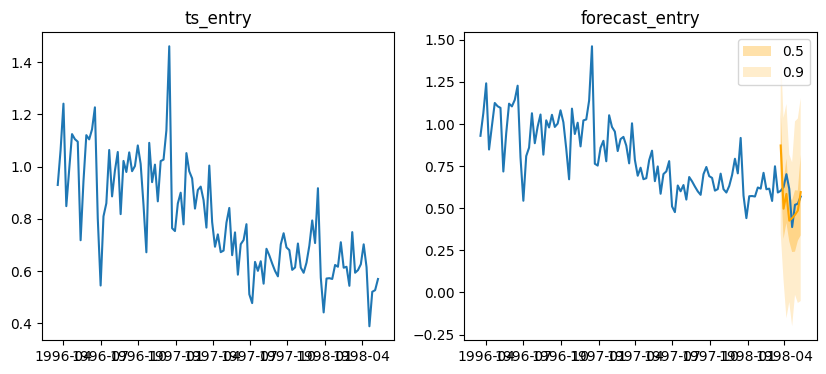

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.2737299  1.1360863  0.8785231  0.8741543  0.9785379  0.9556869
 0.98034585 0.9572817 ]
0.5-quantile (median) of the future window:
 [1.3149911  1.1379365  0.836142   0.9009374  0.99419737 0.9726464
 0.9915562  0.9048833 ]


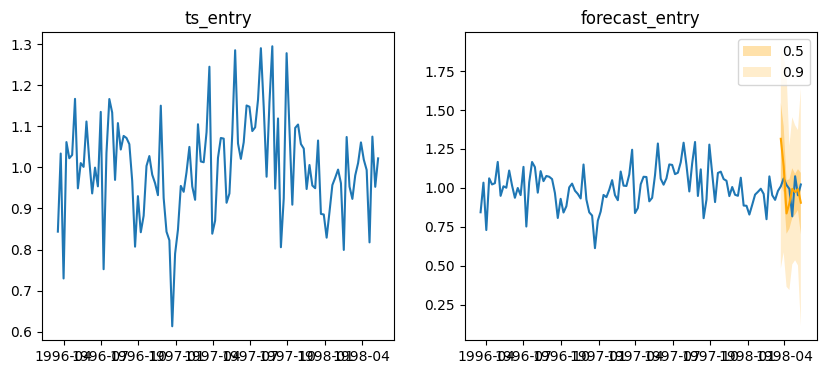

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.0879638  0.98902327 0.9108162  0.7867702  0.9070133  0.78453326
 0.9096645  0.7876903 ]
0.5-quantile (median) of the future window:
 [1.0796361  0.99570316 0.9196912  0.83400226 0.8681416  0.8281056
 0.8761692  0.81386983]


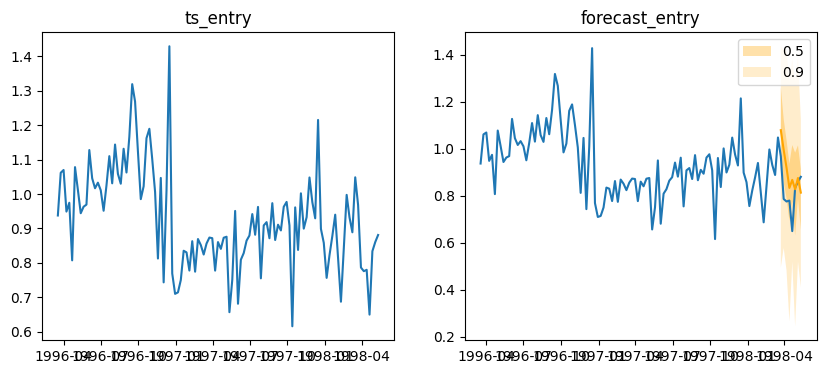

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.2466924  0.9938998  0.8431592  0.911948   0.8055804  0.78296036
 0.82904565 0.833228  ]
0.5-quantile (median) of the future window:
 [1.2905465  1.0042646  0.8558386  0.87647265 0.8120416  0.79275656
 0.8159784  0.80715084]


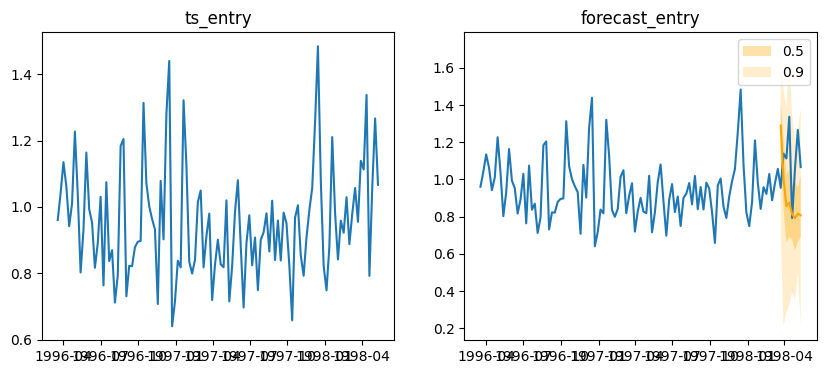

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.6321936 1.3918201 1.2897068 1.1938405 1.2991203 1.2479628 1.3670028
 1.3249594]
0.5-quantile (median) of the future window:
 [1.6971725 1.4400824 1.3428371 1.199941  1.3033621 1.2747502 1.3759462
 1.3357959]


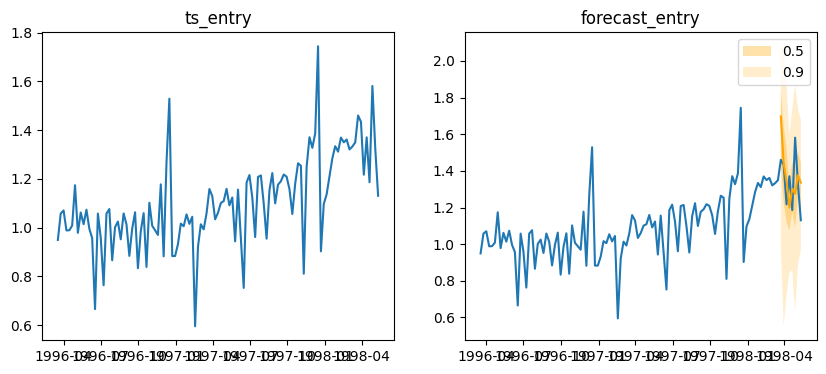

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.2520378  1.0146999  0.9292976  0.8544682  0.92676616 0.8981452
 0.90323013 0.8732083 ]
0.5-quantile (median) of the future window:
 [1.2081757  1.0366839  0.90866375 0.82855636 0.8913405  0.86652863
 0.89588565 0.88007677]


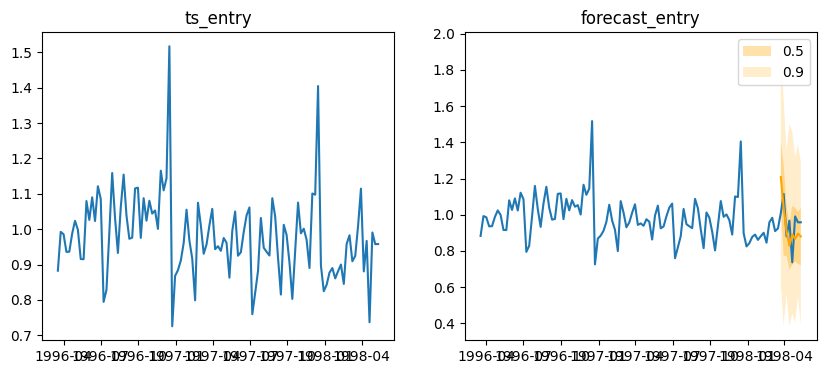

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.1949155  0.9636149  0.79049295 0.8379412  0.72633576 0.8701155
 0.83362085 0.90700775]
0.5-quantile (median) of the future window:
 [1.162396   0.9388823  0.80832636 0.833963   0.70608896 0.86314225
 0.83846915 0.8450576 ]


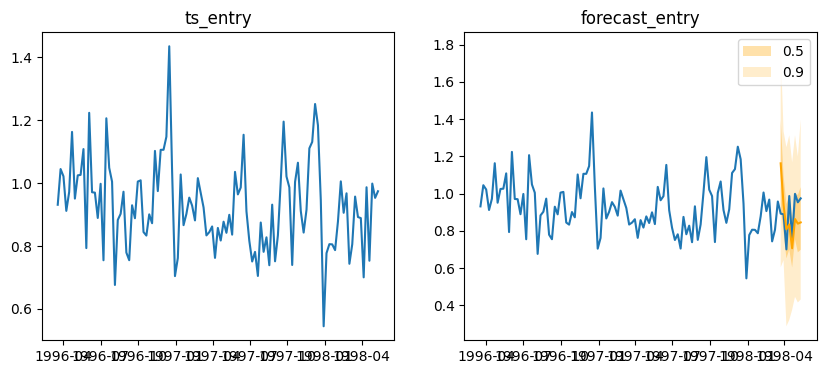

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [0.7777412  0.74309206 0.75820124 0.6398616  0.73546934 0.7092084
 0.8476737  0.8162663 ]
0.5-quantile (median) of the future window:
 [0.80249596 0.745962   0.74935067 0.6825728  0.71960676 0.7395069
 0.8537944  0.80624706]


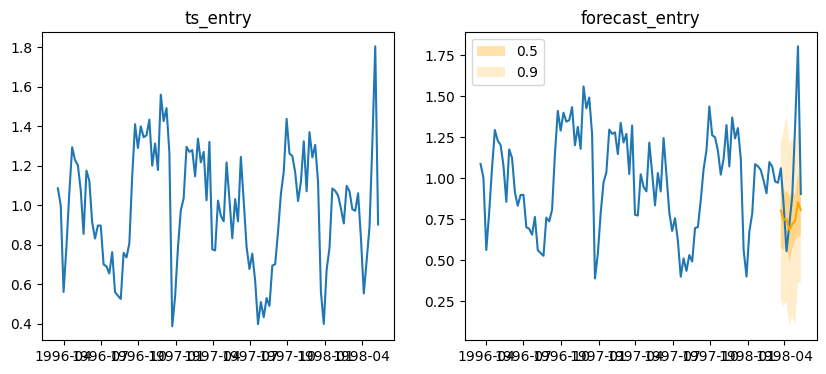

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.4106567  1.2747486  1.208425   0.99898964 1.0083357  1.0288363
 0.9621018  0.95827055]
0.5-quantile (median) of the future window:
 [1.4272234  1.2378646  1.1302648  0.98834294 1.0293914  1.0166756
 1.0198624  1.0053796 ]


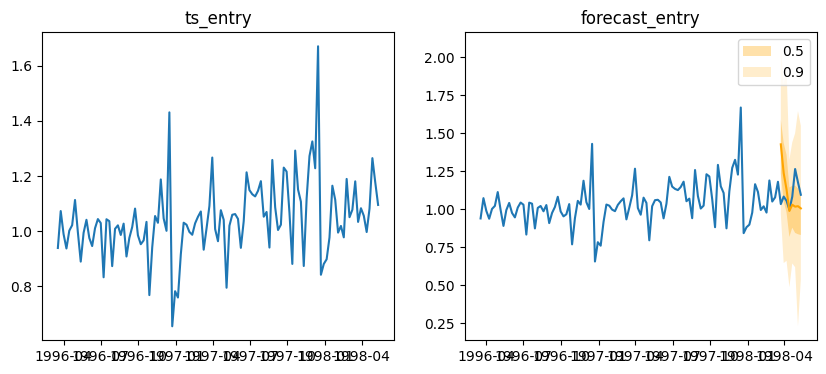

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.6373421  1.3436738  1.1092539  0.98647064 1.0106944  1.0269655
 1.208436   1.2165647 ]
0.5-quantile (median) of the future window:
 [1.6947646 1.3724334 1.0980723 1.0296345 1.0305355 1.0262132 1.1837225
 1.1401399]


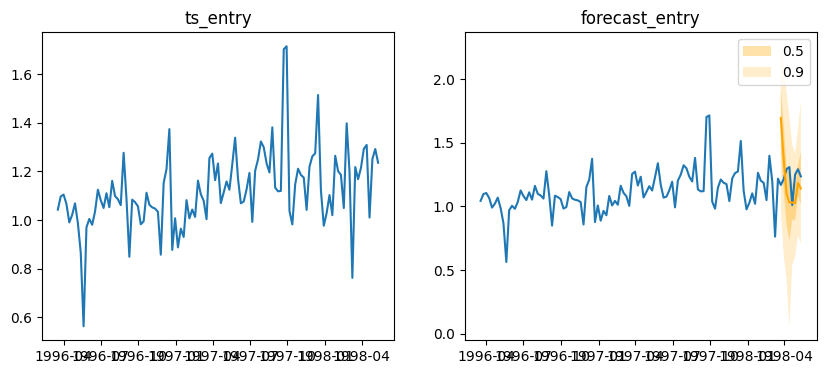

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.3666396 1.1828966 1.160946  0.9993257 0.9718487 1.0216491 1.1157799
 1.1043166]
0.5-quantile (median) of the future window:
 [1.3507451  1.1878288  1.0858836  0.97486293 0.9632187  1.0312672
 1.0999442  1.0760262 ]


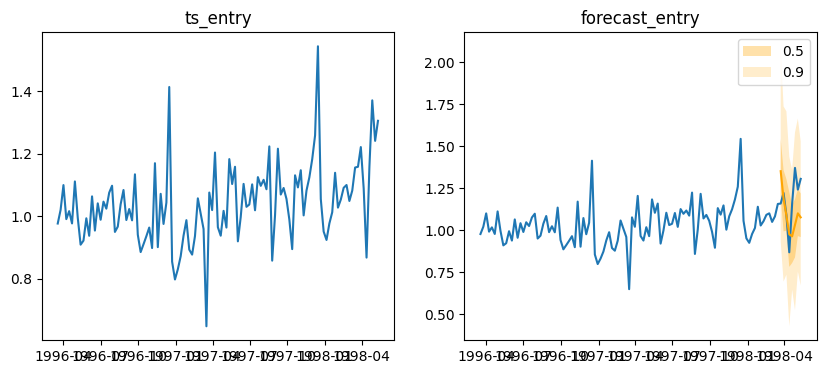

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.269529  1.1182582 1.0559142 0.9934656 1.0058726 0.9985742 1.0068517
 0.9788955]
0.5-quantile (median) of the future window:
 [1.2982144  1.1517266  1.0504937  0.9911432  1.0158271  1.0050466
 0.9767582  0.98031926]


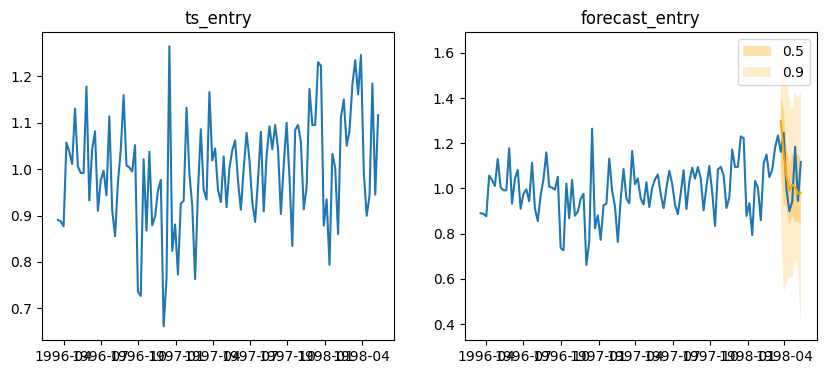

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.2942163  1.2206112  1.0800017  0.9488806  1.0459626  0.83422965
 0.9358046  0.95892453]
0.5-quantile (median) of the future window:
 [1.3003482  1.2542748  1.0663742  0.94359064 1.0286238  0.8277746
 0.97917897 0.93667775]


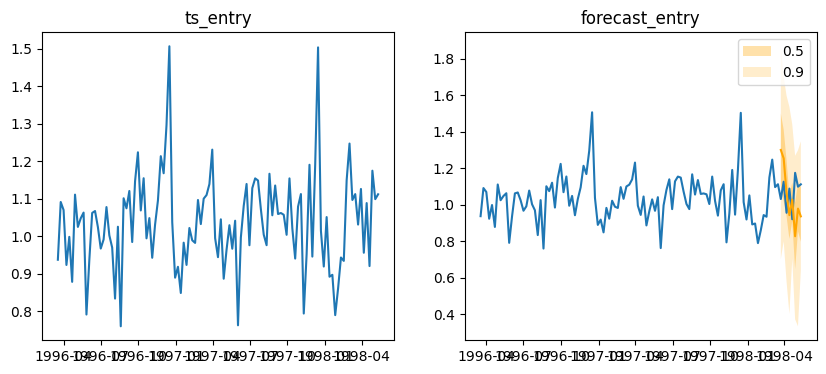

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.104235   1.1855713  0.7829952  0.83575827 0.93307894 0.9151202
 0.9586707  0.98786545]
0.5-quantile (median) of the future window:
 [1.1593124  1.1355789  0.81429696 0.837427   0.9207841  0.9212719
 0.9754778  0.98802024]


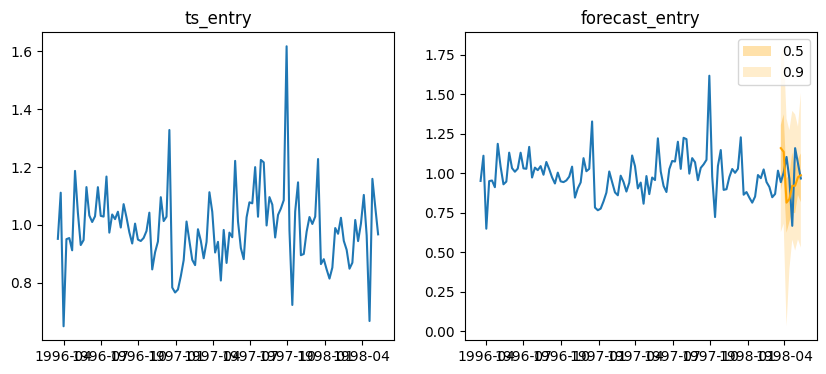

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.5551983  1.1977637  1.1151661  0.93541574 1.0687566  1.0749384
 1.1665289  1.1231507 ]
0.5-quantile (median) of the future window:
 [1.5312829 1.2141484 1.1398741 0.9917705 1.0538774 1.0750761 1.1305765
 1.1523271]


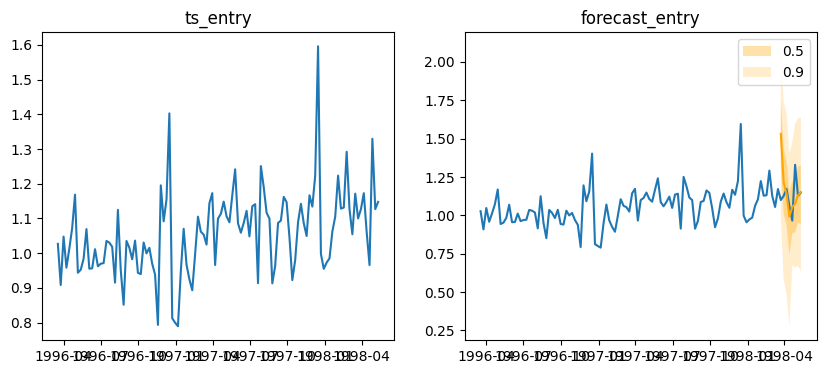

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.5045782 1.1783894 1.0310624 0.8799629 1.0731547 1.013391  1.0559683
 1.0241307]
0.5-quantile (median) of the future window:
 [1.5225387  1.1902305  1.0022571  0.95677567 1.0223227  0.9936547
 1.0872104  1.0184863 ]


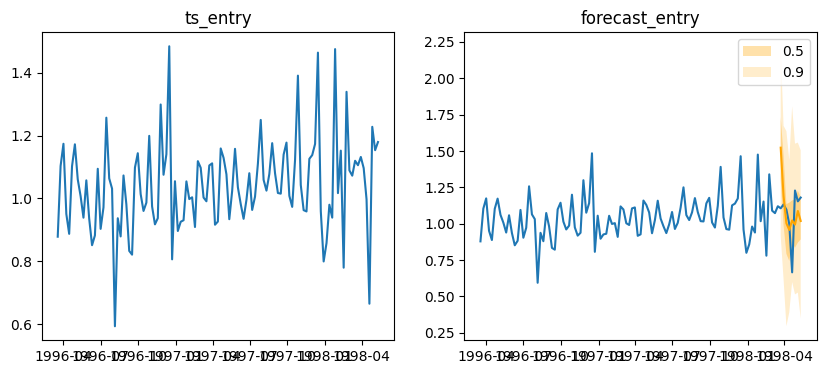

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.4866425 1.2177479 1.1083549 1.0821831 1.0565767 1.0453839 1.1410867
 1.186589 ]
0.5-quantile (median) of the future window:
 [1.4627984 1.2354927 1.146483  1.0457124 1.0823786 1.0504535 1.1360451
 1.1819501]


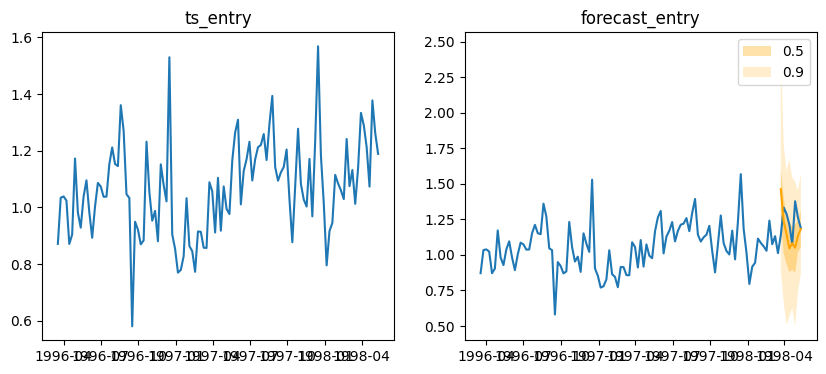

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.975787  1.8235437 1.6104646 1.4887239 1.5783012 1.5995022 1.6755688
 1.6191722]
0.5-quantile (median) of the future window:
 [2.031495  1.7486078 1.6415017 1.4454645 1.5713203 1.5867224 1.689531
 1.6767715]


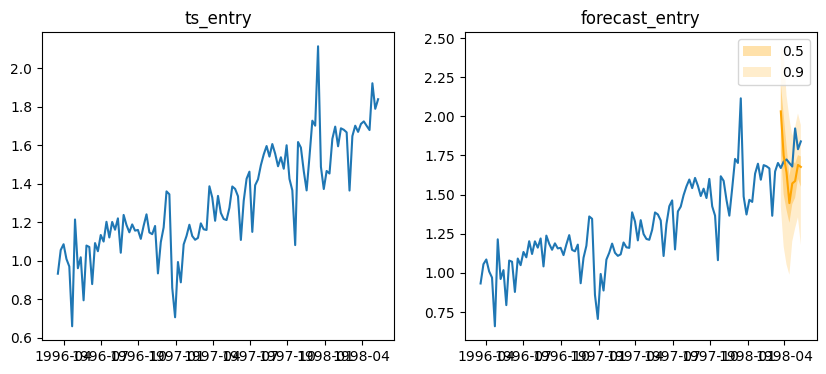

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.390484   1.1739808  1.0630255  0.9755164  0.9929815  0.9752397
 0.99910086 1.0063779 ]
0.5-quantile (median) of the future window:
 [1.3969511 1.1268964 1.097591  0.963015  1.0119725 1.014214  1.0189928
 1.0249274]


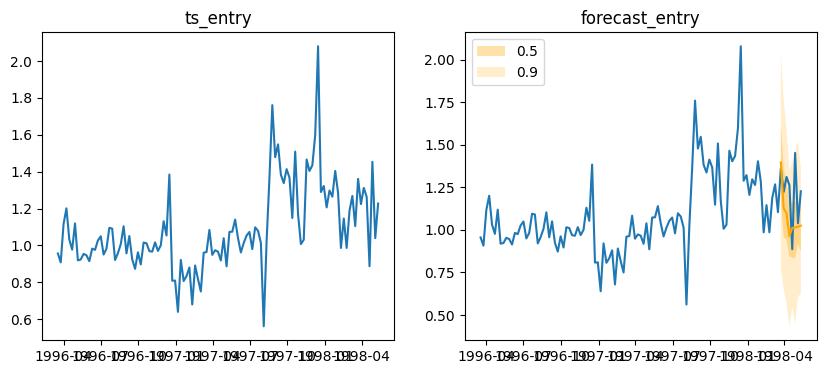

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [1.2609646  0.87815416 0.66481733 0.50845915 0.8343776  0.6488582
 0.8197718  0.82219523]
0.5-quantile (median) of the future window:
 [1.2617776  0.80230683 0.7179913  0.49158978 0.7771256  0.6406299
 0.79059374 0.9010252 ]


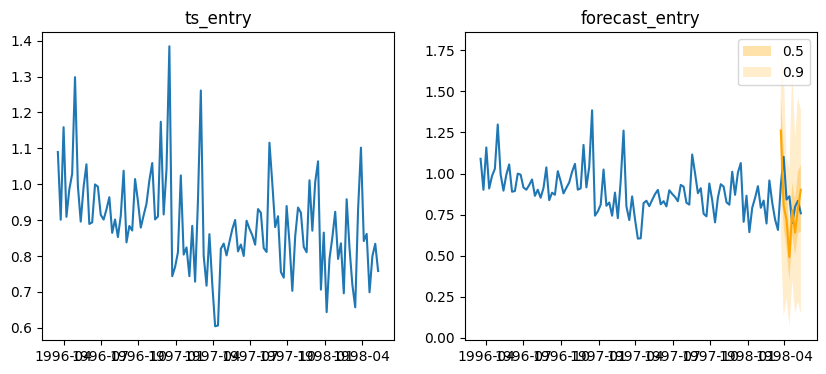

Number of sample paths: 100
Dimension of samples: (100, 8)
Start date of the forecast window: 1998-03-23/1998-03-29
Frequency of the time series: <Week: weekday=6>
Mean of the future window:
 [0.8734962  0.769922   0.702868   0.6549238  0.6738889  0.710474
 0.61688256 0.67072105]
0.5-quantile (median) of the future window:
 [0.92568654 0.7943551  0.6758934  0.6254526  0.6855136  0.6747153
 0.59645724 0.6895649 ]


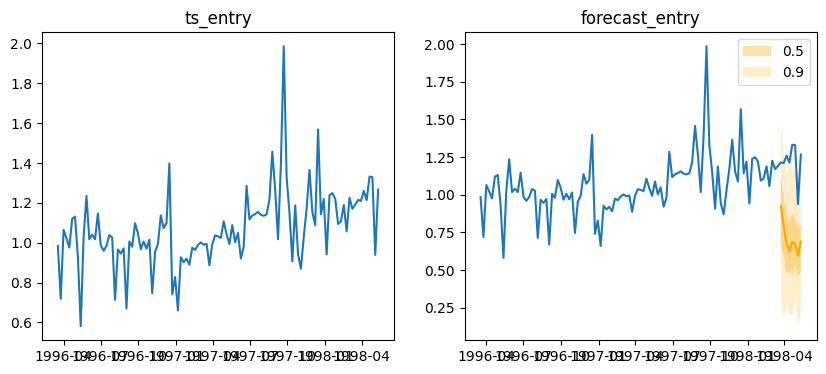

In [14]:
for ts_index in range(min(50, len(test_dataset))):
    ts_entry = tss[ts_index]
    dataset_test_entry = test_dataset[ts_index]
    forecast_entry = forecasts[ts_index]
    
    print(f"Number of sample paths: {forecast_entry.num_samples}")
    print(f"Dimension of samples: {forecast_entry.samples.shape}")
    print(f"Start date of the forecast window: {forecast_entry.start_date}")
    print(f"Frequency of the time series: {forecast_entry.freq}")

    print(f"Mean of the future window:\n {forecast_entry.mean}")
    print(f"0.5-quantile (median) of the future window:\n {forecast_entry.quantile(0.5)}")

    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 4)) 

    axs[0].plot(ts_entry[-150:].to_timestamp()) 
    axs[0].set_title('ts_entry')

    axs[1].plot(ts_entry[-150:].to_timestamp())  
    forecast_entry.plot(show_label=True, color="orange", ax=axs[1]) 
    axs[1].set_title('forecast_entry')
    axs[1].legend()
    
    plt.show()